**Table of contents**<a id='toc0_'></a>    
- [Проект: исследование рынка заведений общественного питания Москвы](#toc1_)    
  - [Описание проекта](#toc1_1_)    
  - [Описание данных](#toc1_2_)    
  - [Загрузка и подготовка данных](#toc1_3_)    
    - [Пропуски](#toc1_3_1_)    
    - [Дубликаты](#toc1_3_2_)    
    - [Категории](#toc1_3_3_)    
    - [Обзор числовых данных заведений: рейтинг, средний чек, стоимость чашки кофе, места](#toc1_3_4_)    
  - [Предобработка данных](#toc1_4_)    
    - [Средний чек](#toc1_4_1_)    
    - [Сетевые заведения](#toc1_4_2_)    
    - [Средняя цена чашки кофе](#toc1_4_3_)    
    - [Количество мест](#toc1_4_4_)    
    - [Добавляем столбец с улицей](#toc1_4_5_)    
    - [Выделяем заведения, работающие 24/7](#toc1_4_6_)    
    - [Выводы](#toc1_4_7_)    
  - [Анализ данных](#toc1_5_)    
    - [Категории заведений](#toc1_5_1_)    
    - [Количество мест по категориям](#toc1_5_2_)    
    - [Сетевые и несетевые заведения](#toc1_5_3_)    
    - [Сетевые заведения по категориям](#toc1_5_4_)    
    - [Топ-15 сетей Москвы](#toc1_5_5_)    
    - [Заведения по районам Москвы](#toc1_5_6_)    
    - [Средний рейтинг по категории](#toc1_5_7_)    
    - [Хороплет со средним рейтингом заведений каждого района](#toc1_5_8_)    
    - [Все заведения на карте](#toc1_5_9_)    
    - [Топ-15 улиц по количеству заведений](#toc1_5_10_)    
    - [Улицы с одним заведением](#toc1_5_11_)    
    - [Зависимость цены от района](#toc1_5_12_)    
    - [Районы с низкими оценками](#toc1_5_13_)    
    - [Выводы](#toc1_5_14_)    
  - [Детализация исследования](#toc1_6_)    
    - [Сколько кофеен в Москве?](#toc1_6_1_)    
    - [Распределение кофеен по районам](#toc1_6_2_)    
    - [Круглосуточные кофейни](#toc1_6_3_)    
    - [Какие рейтинги у кофеен?](#toc1_6_4_)    
    - [Распределение рейтингов по районам](#toc1_6_5_)    
    - [Стартовая стоимость чашки капучино](#toc1_6_6_)    
    - [Несетевые кофейни](#toc1_6_7_)    
    - [Выводы](#toc1_6_8_)    
    - [Рекомендации](#toc1_6_9_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[Проект: исследование рынка заведений общественного питания Москвы](#toc0_)

## <a id='toc1_1_'></a>[Описание проекта](#toc0_)

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.\
Нам предстоит проанализировать рынок заведений общественного питания и представить результаты анализа инвесторам. В дальнейшем это поможет создать заведение подходящего формата в хорошем месте.

Для анализа предоставлен датасет с информацией о заведениях общественного питания Москвы, составленый на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс.Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## <a id='toc1_2_'></a>[Описание данных](#toc0_)

Файл `moscow_places.csv`: \
`name` — название заведения; \
`address` — адрес заведения; \
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»; \
`hours` — информация о днях и часах работы; \
`lat` — широта географической точки, в которой находится заведение; \
`lng` — долгота географической точки, в которой находится заведение; \
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0); \
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее; \
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
* «Средний счёт: 1000–1500 ₽»;
* «Цена чашки капучино: 130–220 ₽»;
* «Цена бокала пива: 400–600 ₽». 
   и так далее; 

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт. 

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт. 

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
* 0 — заведение не является сетевым
* 1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ; \
`seats` — количество посадочных мест.

## <a id='toc1_3_'></a>[Загрузка и подготовка данных](#toc0_)

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", 100)
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [9, 4]
import seaborn as sns
import plotly.express as px
import numpy as np
import json
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings('ignore') 

In [2]:
cafe = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv', sep=',')
cafe_raw = cafe
print(cafe.head(10))

                   name         category  \
0                WoWфли             кафе   
1        Четыре комнаты         ресторан   
2                 Хазри             кафе   
3  Dormouse Coffee Shop          кофейня   
4             Иль Марко         пиццерия   
5          Sergio Pizza         пиццерия   
6           Огни города          бар,паб   
7            Mr. Уголёк  быстрое питание   
8           Donna Maria         ресторан   
9                Готика             кафе   

                                   address                         district  \
0               Москва, улица Дыбенко, 7/1  Северный административный округ   
1       Москва, улица Дыбенко, 36, корп. 1  Северный административный округ   
2           Москва, Клязьминская улица, 15  Северный административный округ   
3      Москва, улица Маршала Федоренко, 12  Северный административный округ   
4          Москва, Правобережная улица, 1Б  Северный административный округ   
5             Москва, Ижорская улица, вл8

In [3]:
print(cafe.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


В большинстве столбцов тип данных соответствует содержимому. Но `chain` на этапе предобработки переведем в тип boolean, а `seats` - в int.

### <a id='toc1_3_1_'></a>[Пропуски](#toc0_)

In [4]:
print("Проценты пропусков:")
print((cafe.isna().sum() / len(cafe)).round(4) * 100)

Проценты пропусков:
name                  0.00
category              0.00
address               0.00
district              0.00
hours                 6.38
lat                   0.00
lng                   0.00
rating                0.00
price                60.56
avg_bill             54.60
middle_avg_bill      62.54
middle_coffee_cup    93.64
chain                 0.00
seats                42.96
dtype: float64


Датасет содержит информацию о 8406 точках общественного питания. Не о каждом заведении предоставлена полная информация. \
Больше всего пропусков в столбце с информацией о стоимости чашки кофе - почти 94%. С ними мы ничего не можем сделать сейчас. \
В столбцах price, avg_bill, middle_avg_bill пропуски более чем в половине строк. Слишком много чтобы удалить, поэтому оставим эти данные. Они могут понадобиться при анализе на темы, не связанные со той или иной стоимостью.\
Пропуски в seats могут быть связаны как с отсутствием информации, так и вероятным отсутствием посадочных мест (заведение может работать только навынос). Оставим как есть, эти строки могут пригодиться, а их удаление исказит данные. \
Часы работы пропущены чуть больше чем в 6% строк.

### <a id='toc1_3_2_'></a>[Дубликаты](#toc0_)

In [5]:
print('Количество дубликатов:', cafe.duplicated().sum())

Количество дубликатов: 0


Явных дубликатов нет.

In [6]:
cafe.name.value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Кофейня 613           1
Чехофф                1
Мой дом               1
Даблби                1
Martinez              1
Name: name, Length: 5614, dtype: int64

Выше мы подсчитали, что всего у нас 8406 точек, при этом 5614 наименований: некоторые заведения сетевые и потому имеют одинаковые названия. \
На этом этапе хотелось бы проверить правильность написания названий заведений: возможно, что при внесении данных пользователями были допущены ошибки. Однако значений слишком много, и единичные опечатки вряд ли испортят весь анализ.

### <a id='toc1_3_3_'></a>[Категории](#toc0_)

In [7]:
cafe.category.value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

С типами заведений всё в порядке: они уникальны.

### <a id='toc1_3_4_'></a>[Обзор числовых данных заведений: рейтинг, средний чек, стоимость чашки кофе, места](#toc0_)

In [8]:
cafe[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].describe()

,rating,middle_avg_bill,middle_coffee_cup,seats
count,8406.000000,3149.000000,535.000000,4795.000000
mean,4.229895,958.053668,174.721495,108.421689
std,0.470348,1009.732845,88.951103,122.833396
min,1.000000,0.000000,60.000000,0.000000
25%,4.100000,375.000000,124.500000,40.000000
50%,4.300000,750.000000,169.000000,75.000000
75%,4.400000,1250.000000,225.000000,140.000000
max,5.000000,35000.000000,1568.000000,1288.000000


Более 75% заведений имеют рейтинг 4,4, а диапазон оценок 1,0-5,0. Очевидно, что всё в порядке. \
Средний чек: от 0 до 35000, при этом более чем в 75% заведений он составляет 1250 рублей. \
Средняя стоимость чашки кофе: от 60 до 1568 рублей. \
Количество мест колеблется от 0 до 1288. 

In [9]:
print(cafe.loc[cafe['middle_avg_bill'] == 35000])

      name  category                              address  \
7177  Кафе  ресторан  Москва, Каширское шоссе, 23, стр. 2   

                          district                     hours       lat  \
7177  Южный административный округ  ежедневно, круглосуточно  55.65745   

            lng  rating    price                    avg_bill  middle_avg_bill  \
7177  37.646665     4.1  высокие  Средний счёт:20000–50000 ₽          35000.0   

      middle_coffee_cup  chain  seats  
7177                NaN      0  100.0  


Выглядит немного странно.

In [10]:
print(cafe.loc[cafe['seats'] == 1288])

                    name  category  \
6518         DelonixCafe  ресторан   
6524           Ян Примус  ресторан   
6574              Мюнгер  пиццерия   
6641    One Price Coffee   кофейня   
6658              ГудБар   бар,паб   
6684     Пивной ресторан   бар,паб   
6690      Японская кухня  ресторан   
6771               Точка      кафе   
6807  Loft-cafe академия      кафе   
6808        Яндекс Лавка  ресторан   
6838  Alternative coffee   кофейня   

                                         address  \
6518   Москва, проспект Вернадского, 94, корп. 1   
6524  Москва, проспект Вернадского, 121, корп. 1   
6574   Москва, проспект Вернадского, 97, корп. 1   
6641    Москва, проспект Вернадского, 84, стр. 1   
6658   Москва, проспект Вернадского, 97, корп. 1   
6684  Москва, проспект Вернадского, 121, корп. 1   
6690  Москва, проспект Вернадского, 121, корп. 1   
6771    Москва, проспект Вернадского, 84, стр. 1   
6807    Москва, проспект Вернадского, 84, стр. 1   
6808    Москва, проспек

А вот здесь мы нашли что-то странное: с таким большим и одинаковым количеством мест нашлось 11 заведений, у некоторых из них совпадают адреса. Ни одно из заведений (особенно Яндекс Лавка, работающая только на доставку) не может иметь столько посадочных мест. \
Пока что оставим эти строки, поскольку в них есть другая информация, пригодная для анализа.

In [11]:
cafe.duplicated(['address']).sum()

2653

Предыдущий шаг натолкнул на мысль, что стоит проверить дубликаты по адресу, и таких нашлось 2653 строки. Но это вполне реальная ситуация, когда в одном здании расположено несколько заведений.

## <a id='toc1_4_'></a>[Предобработка данных](#toc0_)

Начнем визуализировать данные для удобства предобработки.

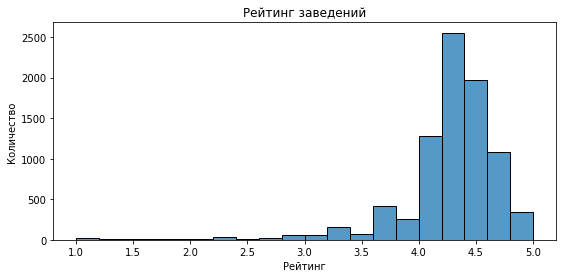

In [12]:
sns.histplot(data=cafe, x='rating', bins=20).set(title='Рейтинг заведений', xlabel='Рейтинг', ylabel='Количество')
None

У большинства заведений средняя оценка лежит в диапазоне 4.0-5.0.

### <a id='toc1_4_1_'></a>[Средний чек](#toc0_)

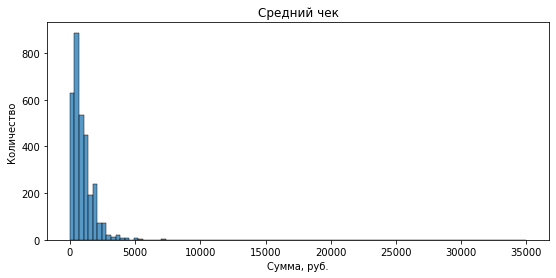

In [13]:
sns.histplot(data=cafe, x='middle_avg_bill', bins=100).set(title='Средний чек', xlabel='Сумма, руб.', ylabel='Количество')
None

В датасете есть большое количество строк с пропусками в среднем чеке, и это мы видим на гистограмме. Здесь же видим одно заведение со средним чеком в 35000, ранее мы посмотрели на информацию о нем. \
В основном средний чек меньше 5000.

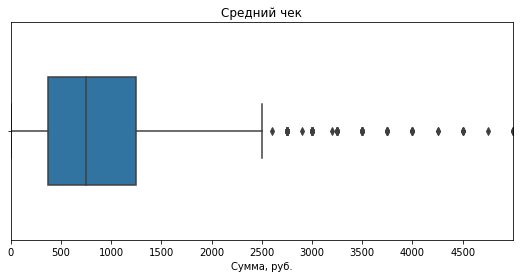

In [14]:
sns.boxplot(x='middle_avg_bill', data=cafe, width=.5).set(title='Средний чек', xlabel='Сумма, руб.')
plt.xlim([0, 5000])
plt.xticks(np.arange(0, 5000, 500))
None

Исходя из диаграммы размаха, заведения со средним чеком выше 2500 - это выбросы. 

In [15]:
print('Процент от общего числа заведений:', round(len(cafe.query('middle_avg_bill > 2500'))/len(cafe)*100, 2)) 

Процент от общего числа заведений: 1.24


От такого количества мы можем безболезненно избавиться. Вряд ли инвесторы собираются открыть уникальное заведение с запредельным чеком.

In [16]:
cafe['middle_avg_bill'] = cafe['middle_avg_bill'].fillna(-1)
cafe = cafe.query('middle_avg_bill <= 2500')
#print(cafe.info()) 


In [17]:
cafe.query('middle_avg_bill == 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


In [18]:
cafe.query('name == "Кофемания"')['middle_avg_bill']

1377    1400.0
1451    2000.0
1790      -1.0
1870    1050.0
1883    2000.0
3013      -1.0
3509    2000.0
3651    2000.0
3685    2500.0
3688       0.0
3839    1750.0
4008    2250.0
4038    2000.0
4060      -1.0
4220    2000.0
4502    2000.0
4568    2000.0
4756    2000.0
4971    2000.0
5132      -1.0
5703      -1.0
6057      -1.0
6708      -1.0
Name: middle_avg_bill, dtype: float64

Как минимум этот филиал Кофемании отнесен к заведениям с высокой ценой. Прежде чем заполнять пропуск, выясним границы ценовых категорий.

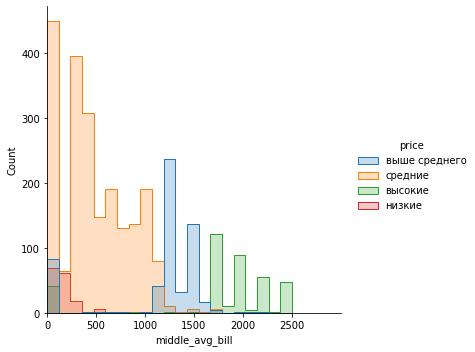

In [19]:
sns.displot(cafe, x="middle_avg_bill", hue="price", element="step")
plt.xlim([0, 3000])
plt.xticks(np.arange(0, 3000, 500))
None

Видим, что:
* низкие цены - это от 0 до 400 рублей
* средние - самая обширная категория, в которой много пропусков, со средним чеком 300-1200 рублей
* выше среднего - 1000-1800 рублей
* высокие - 1800-2500.

Также видим, что категории пересекаются.

Вернемся к Кофемании. Поскольку это заведение с высоким средним чеком, заменим 0 модой, т.е. 2000. Используем моду, потому что как правило ценовая категория заведений сети одинаковая: клиент получает одни и те же продукты за одинаковую стоимость, и всё это совмещено с территориальным удобством. \
Могут быть исключения: например, расположенная в аэропорту точка общественного питания может иметь более высокие цены, чем остальные точки в сети.

In [20]:
cafe.loc[3688, 'middle_avg_bill'] = 2000

### <a id='toc1_4_2_'></a>[Сетевые заведения](#toc0_)

In [21]:
cafe['chain'] = cafe['chain'].astype('bool')
chain_cafe = cafe.query('chain == True')
chain_cafe.name.value_counts()

Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Яндекс Лавка         69
                   ... 
Drive                 1
Пекарня № 1           1
Роллофф               1
Бакинский дворик      1
Мясо на углях         1
Name: name, Length: 762, dtype: int64

В таблице есть заведения, обозначенные как сетевые, но сетевыми не являющиеся по крайней мере на момент анализа. 

In [22]:
real = chain_cafe[chain_cafe.duplicated(['name'], keep=False)]
real = real['name'].unique()
cafe['chain'] = np.where(cafe['name'].isin(real), True, False) 
#создали лист названий сетевых заведений по принципу дублирующихся названий, исправили значения в колонке chain

In [23]:
{
    "tags": [
        "hide-cell"
    ]
}
print(cafe.query('name == "Рома"'))
print(cafe.query('name == "Шоколадница"'))
print(cafe.sample(20))
#тесты

      name category                   address  \
3319  Рома     кафе  Москва, улица Барклая, 8   

                             district hours        lat        lng  rating  \
3319  Западный административный округ   NaN  55.741073  37.502889     4.6   

     price avg_bill  middle_avg_bill  middle_coffee_cup  chain  seats  
3319   NaN      NaN             -1.0                NaN  False   35.0  
             name category                                  address  \
151   Шоколадница  кофейня        Москва, Дмитровское шоссе, 163Ак1   
240   Шоколадница  кофейня               Москва, Широкая улица, 13А   
343   Шоколадница  кофейня  Москва, Фестивальная улица, 13, корп. 1   
360   Шоколадница  кофейня            Москва, Сходненская улица, 25   
381   Шоколадница  кофейня            Москва, Сходненская улица, 56   
...           ...      ...                                      ...   
7651  Шоколадница  кофейня         Москва, Кировоградская улица, 14   
7670  Шоколадница  кофейня        

### <a id='toc1_4_3_'></a>[Средняя цена чашки кофе](#toc0_)

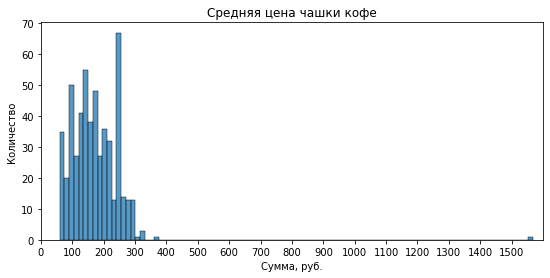

In [24]:
sns.histplot(data=cafe, x='middle_coffee_cup', bins=100).set(title='Средняя цена чашки кофе', xlabel='Сумма, руб.', ylabel='Количество')
plt.xlim([0, 1600])
plt.xticks(np.arange(0, 1600, 100))
None
 

Цены на чашку кофе находятся в диапазоне от 70 до 300 рублей с выбросом, который мы видели ранее.

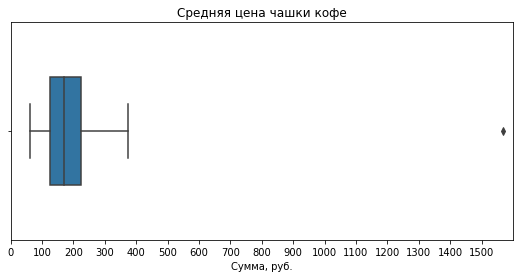

In [25]:
sns.boxplot(x='middle_coffee_cup', data=cafe, width=.5).set(title='Средняя цена чашки кофе', xlabel='Сумма, руб.')
plt.xlim([0, 1600])
plt.xticks(np.arange(0, 1600, 100))
None

In [26]:
cafe.query('middle_coffee_cup > 600')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,-1.0,1568.0,True,48.0


In [27]:
cafe.query('name == "Шоколадница"')['middle_coffee_cup'].value_counts()

256.0     43
260.0      3
266.0      3
291.0      3
220.0      2
1568.0     1
214.0      1
325.0      1
250.0      1
227.0      1
170.0      1
287.0      1
246.0      1
Name: middle_coffee_cup, dtype: int64

256 рублей - мода средней стоимости чашки кофе. Заменим явную ошибку на моду.

In [28]:
cafe.loc[2859,'middle_coffee_cup'] = 256

### <a id='toc1_4_4_'></a>[Количество мест](#toc0_)

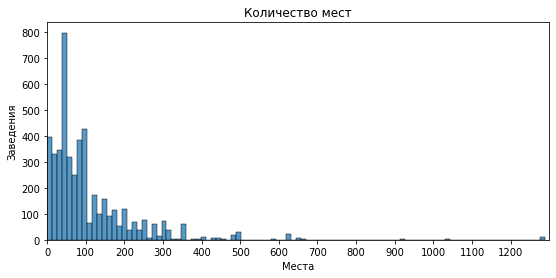

In [29]:
plt.figure(figsize=(9,4))
sns.histplot(data=cafe, x='seats', bins=100).set(title='Количество мест', xlabel='Места', ylabel='Заведения')
plt.xlim([0, 1300])
plt.xticks(np.arange(0, 1300, 100))
None

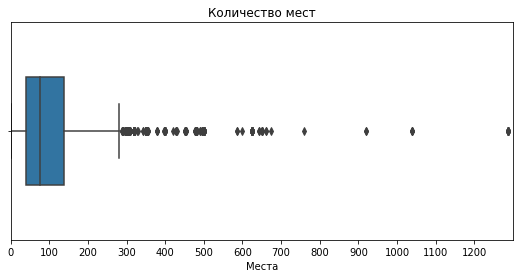

In [30]:
sns.boxplot(x='seats', data=cafe, width=.5).set(title='Количество мест', xlabel='Места')
plt.xlim([0, 1300])
plt.xticks(np.arange(0, 1300, 100))
None

В основном, в заведениях от 50 до 150 посадочных мест, но имеются выбросы с количеством мест больше 300. Прежде чем их отсекать, проверим, велика ли их доля.

In [31]:
print('Процент от общего числа заведений:', round(len(cafe.query('seats > 300'))/len(cafe)*100, 2))


Процент от общего числа заведений: 3.0


Всего 3%, значит можем избавиться от заведений с очень большим количеством мест.

In [32]:
cafe['seats'] = cafe['seats'].fillna(-1)
cafe = cafe.query('seats < 300')
cafe['seats'] = cafe['seats'].astype('int')
#print(cafe.info())

### <a id='toc1_4_5_'></a>[Добавляем столбец с улицей](#toc0_)

In [33]:
for i in cafe.index:
    test = cafe.loc[i,'address'].split(',')
    cafe.loc[i,'street'] = test[1]
#cafe.sample(5)

### <a id='toc1_4_6_'></a>[Выделяем заведения, работающие 24/7](#toc0_)

In [34]:
for i in cafe.index:
    if cafe.loc[i, 'hours']=='ежедневно, круглосуточно':
        cafe.loc[i, 'is_24/7'] = True
    else:
        cafe.loc[i, 'is_24/7'] = False

cafe['is_24/7'] = cafe['is_24/7'].astype('bool')

### <a id='toc1_4_7_'></a>[Выводы](#toc0_)

In [35]:
print('Всего заведений:', len(cafe))
print(f'Потери после предобработки: {100 - (len(cafe)/len(cafe_raw) * 100)}%')

Всего заведений: 7993
Потери после предобработки: 4.913157268617653%


Ознакомились с предоставленными данными и провели предобработку: нашли большое количество пропусков в столбцах `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`. На данном этапе обработать эти пропуски мы не можем, поэтому оставили строки с пропусками, заполнив маркерным значением. \
Исправили неверно указанные данные о том, является ли заведение сетевым. \
Избавились от аномальных значений удалением и заменой, где это было возможно: убрали из датасета заведения с количеством мест больше 300 и средним чеком выше 2500 рублей, исправили ошибку в средней стоимости чашки кофе в одном случае. \
В результате предобработки потеряли 4,9% значений - это допустимый объем. \
Добавили два новых столбца: `street` с названием улицы и `24/7`, в котором указано, работает ли заведение в таком режиме.

## <a id='toc1_5_'></a>[Анализ данных](#toc0_)

### <a id='toc1_5_1_'></a>[Категории заведений](#toc0_)

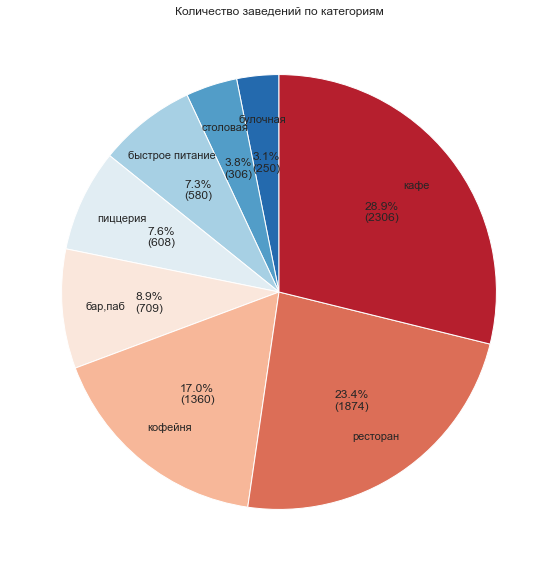

In [36]:

category = cafe.groupby('category')['name'].count().sort_values()
sns.set(font_scale = 1.0)
plt.figure(figsize=(10, 10))
plt.title('Количество заведений по категориям')

def my_fmt(x):
    return '{:.1f}%\n({:.0f})'.format(x, len(cafe)*x/100)

patches, texts, autotexts = plt.pie(
    x=category, 
    labels=category.index, 
    autopct=my_fmt,
    colors=sns.color_palette('RdBu_r', n_colors=8),
    labeldistance=0.80,
    pctdistance=0.6,
    counterclock=True,
    startangle=90)
 
for text in texts:
    text.set_horizontalalignment('center')
 
for autotext in autotexts:
    autotext.set_horizontalalignment('center')

plt.savefig('moscafe_category.png', bbox_inches='tight', dpi = 300)
plt.show()
None

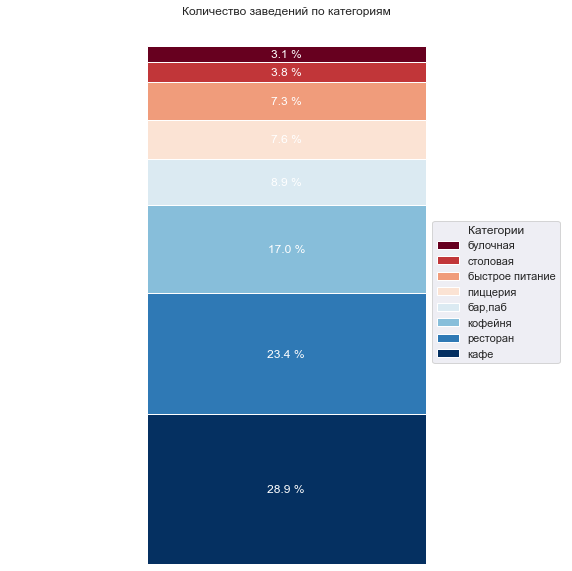

In [37]:
cafe_cat = cafe.pivot_table(index=['category'], values=['address'], aggfunc={'address':'count'}).reset_index().\
rename_axis(None, axis=1)
cafe_cat = cafe_cat.sort_values(by=['address'], ascending=False).reset_index(drop=True)
cafe_cat=cafe_cat.T
cafe_cat.columns = cafe_cat.iloc[0]
cafe_cat=cafe_cat.drop(['category'],axis = 0)
ax = cafe_cat.plot(kind='bar', stacked=True, colormap='RdBu_r', title='Количество заведений по категориям',\
              xlabel='Категории', figsize=(10,10))
plt.axis('off')
total = cafe_cat.values.sum()

for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        ax.text(x+width/2, 
                y+height/2, 
                '{:.1f} %'.format(height / total * 100),
                horizontalalignment='center', 
                verticalalignment='center',
               color='white')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], title='Категории', loc='right')
plt.savefig('moscafe_category_bar.png', bbox_inches='tight', dpi = 300)
plt.show()

None

Более половины заведений - это кафе и рестораны. \
Из заведений общепита больше всего в Москве кафе - 28,9%. На втором месте по количеству рестораны - 23, затем идут кофейни- их 17%. \
Меньше всего в Москве булочных - всего 3,1%.

### <a id='toc1_5_2_'></a>[Количество мест по категориям](#toc0_)

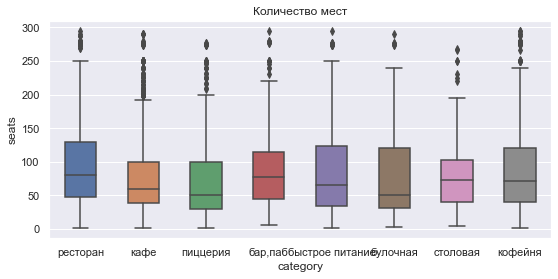

In [38]:
plt.title('Количество мест')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
box_plot = sns.boxplot(x='category', y='seats', data=cafe.query('seats > 0'), width=.5)

ax = box_plot.axes
lines = ax.get_lines()
categories = ax.get_xticks()


Если рассматривать медианное количество мест, то больше всего мест в ресторанах (80), далее идут бары и пабы (77), а затем столовые (73). Меньше всего мест в пиццериях и булочных (50).

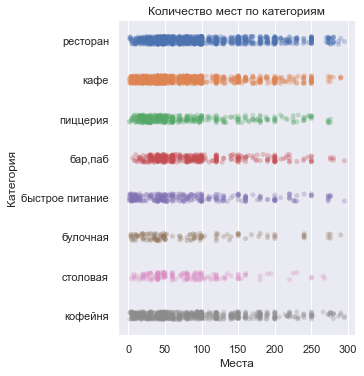

In [39]:
sns.catplot(data=cafe.query('seats > 0'), x="seats", y="category", alpha=0.3).set(title='Количество мест по категориям', xlabel='Места', ylabel='Категория')
None

На диаграмме рассеивания видим, что в основном в заведениях до 100 мест, а в ресторанах, кафе, барах и кофейнях чаще встречаются круглые количества мест: 50, 100, 150, 200. В булочных не так уж часто бывает больше 50 мест, а в барах места есть всегда - их диаграмма рассеивания начинается не с нуля.

### <a id='toc1_5_3_'></a>[Сетевые и несетевые заведения](#toc0_)

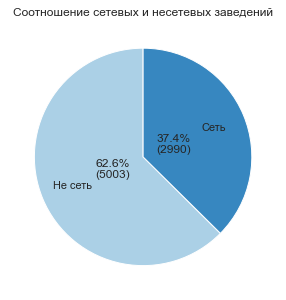

In [40]:
chain = cafe.groupby('chain')['chain'].count()

sns.set(font_scale = 1.0)
plt.figure(figsize=(5, 5))
plt.title('Соотношение сетевых и несетевых заведений')

def my_fmt(x):
    return '{:.1f}%\n({:.0f})'.format(x, len(cafe)*x/100)

patches, texts, autotexts = plt.pie(
    x=chain, 
    labels=['Не сеть', 'Сеть'], 
    autopct=my_fmt,
    colors=sns.color_palette('Blues', n_colors=2),
    labeldistance=0.70,
    pctdistance=0.3,
    counterclock=True,
    startangle=90)
 
for text in texts:
    text.set_horizontalalignment('center')
 
for autotext in autotexts:
    autotext.set_horizontalalignment('center')

plt.show()
None

Более половины (62,6%) заведений Москвы на лето 2022 года - не сетевые.

### <a id='toc1_5_4_'></a>[Сетевые заведения по категориям](#toc0_)

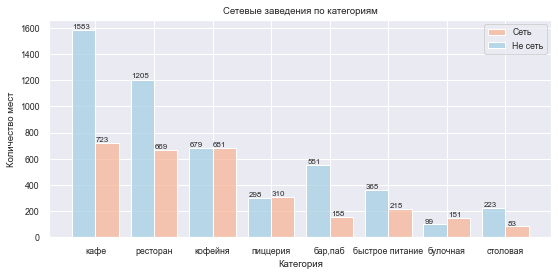

In [41]:
sns.set(font_scale = 0.8)
plt.title('Сетевые заведения по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
ax=sns.histplot(data=cafe, x="category", hue="chain", multiple="dodge", shrink=.8, palette='RdBu_r', discrete=True)
plt.legend(labels=['Сеть', 'Не сеть'], title = None, loc = 'upper right')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005), fontsize = 'small', ha='left', va='bottom')
plt.savefig('moscafe_chain_category.png', bbox_inches='tight', dpi = 300)
None

Видим, что среди кафе, ресторанов, баров и столовых преобладают несетевые заведения. Среди кофеен практически одинаковое количество сетевых и несетевых заведений.

### <a id='toc1_5_5_'></a>[Топ-15 сетей Москвы](#toc0_)

In [42]:
top_cafe = cafe.query('chain == True').groupby(['name', 'category'], as_index=False).agg({'address':'count'})\
.sort_values(by='address', ascending = False).head(15)
top_cafe

,name,category,address
1050,Шоколадница,кофейня,112
468,Домино'с Пицца,пиццерия,76
461,Додо Пицца,пиццерия,71
1066,Яндекс Лавка,ресторан,67
193,One Price Coffee,кофейня,66
69,Cofix,кофейня,62
227,Prime,ресторан,46
520,КОФЕПОРТ,кофейня,40
598,Кулинарная лавка братьев Караваевых,кафе,38
900,Теремок,ресторан,34


Как мы видим, в топ не попали бары, пабы и столовые, что логично: у этих двух категорий меньше всего сетевых заведений.

In [43]:
fig = px.bar(top_cafe.sort_values(by='address', ascending=True), 
             x='address',
             y='name',
             text='address'
            )
fig.update_layout(title='Топ-15 сетевых заведений общепита в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show()

На первом месте по популярности сеть кофеен "Шоколадница" со 113 точками. На втором и третьем месте сетевые пиццерии Домино'с Пицца и Додо Пицца, 76 и 71 точка. \
В топ попали и другие кофейни: Cofix, Кофепорт, One Price Coffee, CofeFest. \
На последнем месте кафе Му-му с 24 точками.

### <a id='toc1_5_6_'></a>[Заведения по районам Москвы](#toc0_)

In [44]:
cafe_districts=cafe.pivot_table(index=['district'],columns=['category'], values=['address'], aggfunc={'address':'count'})

cafe_districts.loc[:,'Всего в округе'] = cafe_districts.sum(numeric_only=True, axis=1)
cafe_districts

address                                \
category                                бар,паб булочная быстрое питание кафе   
district                                                                        
Восточный административный округ             45       25              68  268   
Западный административный округ              46       35              60  228   
Северный административный округ              62       37              55  227   
Северо-Восточный административный округ      58       28              81  259   
Северо-Западный административный округ       22       12              30  113   
Центральный административный округ          336       49              83  442   
Юго-Восточный административный округ         38       13              66  279   
Юго-Западный административный округ          38       27              61  235   
Южный административный округ                 64       24              76  255   

                                                                            \
category                                кофейня пиццерия ресторан столовая   
district                                                                     
Восточный административный округ            104       71      158       40   
Западный административный округ             141       66      189       22   
Северный административный округ             184       69      173       40   
Северо-Восточный административный округ     156       68      175       39   
Северо-Западный административный округ       62       40      107       17   
Центральный административный округ          412      106      587       65   
Юго-Восточный административный округ         89       55      140       25   
Юго-Западный административный округ          95       63      165       17   
Южный административный округ                117       70      180       41   

                                        Всего в округе  
category                                                
district                                                
Восточный административный округ                   779  
Западный административный округ                    787  
Северный административный округ                    847  
Северо-Восточный административный округ            864  
Северо-Западный административный округ             403  
Центральный административный округ                2080  
Юго-Восточный административный округ               705  
Юго-Западный административный округ                701  
Южный административный округ                       827

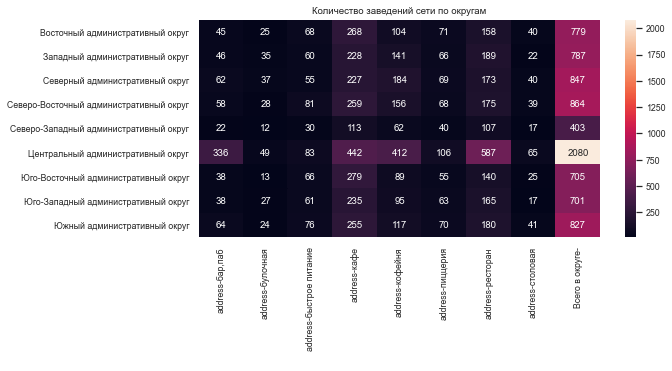

In [45]:
sns.heatmap(cafe_districts, annot= True, fmt='g')
plt.title('Количество заведений сети по округам')
plt.xlabel(' ')
plt.ylabel('')
plt.savefig('moscafe_district_category.png', bbox_inches='tight', dpi = 300)

Больше всего заведений в Центральном административном округе, меньше всего - в Северо-Западном. \
Наиболее популярны в Центральном округе рестораны, кафе, кофейни, бары и пабы, причем именно там из расположено самое большое количество среди всех округов Москвы.

### <a id='toc1_5_7_'></a>[Средний рейтинг по категории](#toc0_)

In [46]:
cafe.groupby('category')['rating'].mean().sort_values(ascending=False)

category
бар,паб            4.386742
пиццерия           4.301151
ресторан           4.281270
кофейня            4.278750
булочная           4.264800
столовая           4.214052
кафе               4.125022
быстрое питание    4.043966
Name: rating, dtype: float64

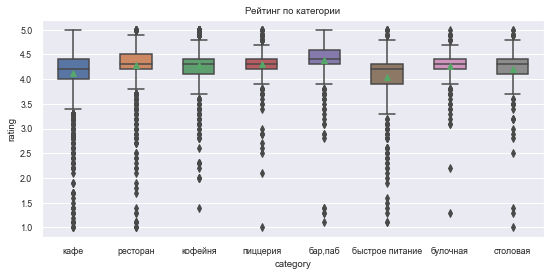

In [47]:
plt.title('Рейтинг по категории')
plt.xlabel('Категория')
plt.ylabel(' ')
box_plot = sns.boxplot(x='category', y='rating', data=cafe, width=.5, showmeans=True)

ax = box_plot.axes
lines = ax.get_lines()
categories = ax.get_xticks()

None

Средняя оценка слабо зависит от типа заведения и колеблется в пределах 4,0-4,38. При этом бары и пабы оценивают высоко (их средняя оценка 4,38), а у самой распространенной категории, кафе, средняя 4,12. У всех категорий заведений есть аномально низкие оценки, и их больше, чем аномально высоких.

### <a id='toc1_5_8_'></a>[Хороплет со средним рейтингом заведений каждого района](#toc0_)

In [48]:
rating_district = cafe.groupby('district', as_index=False)['rating'].agg('mean')
rating_district['rating'] = round(rating_district['rating'], 2)
rating_district.sort_values('rating', ascending=False)

,district,rating
5,Центральный административный округ,4.37
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [49]:

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdBu_r',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_rating)
m_rating

Самые высокие оценки у заведений в Центральном округе, а самые низкие - в Юго-Восточном.

### <a id='toc1_5_9_'></a>[Все заведения на карте](#toc0_)

In [50]:
m_all = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m_all)
def create_clusters(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}"
    ).add_to(marker_cluster)
cafe.apply(create_clusters, axis=1)
m_all

### <a id='toc1_5_10_'></a>[Топ-15 улиц по количеству заведений](#toc0_)

In [51]:
top15_streets = cafe['street'].value_counts().head(15)
top_street = cafe.query('street in @top15_streets.index')

toploc=top_street.pivot_table(index=['street'], columns=['category'], values=['address'], aggfunc={'address':'count'})
toploc.loc[:,'Всего на улице'] = toploc.sum(numeric_only=True, axis=1)
toploc

address                                         \
category                бар,паб булочная быстрое питание  кафе кофейня   
street                                                                   
 Алтуфьевское шоссе         4.0      1.0             5.0  12.0     9.0   
 Варшавское шоссе           6.0      NaN             7.0  18.0    12.0   
 Волгоградский проспект     NaN      NaN             5.0  18.0     9.0   
 Дмитровское шоссе          3.0      2.0             7.0  18.0    10.0   
 Каширское шоссе            2.0      NaN             8.0  18.0    13.0   
 Кутузовский проспект       2.0      1.0             2.0  14.0    13.0   
 Ленинградский проспект    13.0      3.0             2.0   7.0    18.0   
 Ленинградское шоссе        5.0      2.0             5.0  13.0    13.0   
 Ленинский проспект        10.0      3.0             2.0  24.0    23.0   
 Люблинская улица           5.0      NaN             5.0  26.0    11.0   
 МКАД                       1.0      NaN             9.0  45.0     4.0   
 Профсоюзная улица          6.0      4.0            15.0  35.0    18.0   
 проспект Вернадского       5.0      1.0            12.0  23.0    14.0   
 проспект Мира             12.0      4.0            21.0  52.0    36.0   
 улица Миклухо-Маклая       3.0      NaN             4.0  20.0     4.0   

                                                   Всего на улице  
category                пиццерия ресторан столовая                 
street                                                             
 Алтуфьевское шоссе          3.0      9.0      1.0           44.0  
 Варшавское шоссе            4.0     17.0      7.0           71.0  
 Волгоградский проспект      2.0      7.0      1.0           42.0  
 Дмитровское шоссе           5.0     21.0      4.0           70.0  
 Каширское шоссе             4.0     16.0      5.0           66.0  
 Кутузовский проспект        2.0     10.0      2.0           46.0  
 Ленинградский проспект      6.0     17.0      2.0           68.0  
 Ленинградское шоссе         3.0     23.0      3.0           67.0  
 Ленинский проспект          5.0     27.0      5.0           99.0  
 Люблинская улица            1.0     10.0      2.0           60.0  
 МКАД                        NaN      5.0      1.0           65.0  
 Профсоюзная улица          15.0     26.0      3.0          122.0  
 проспект Вернадского       11.0     29.0      2.0           97.0  
 проспект Мира              11.0     42.0      2.0          180.0  
 улица Миклухо-Маклая        2.0     14.0      NaN           47.0

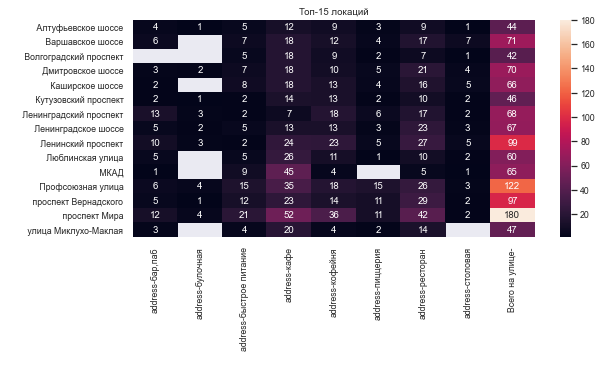

In [52]:
sns.heatmap(toploc, annot= True, fmt='g')
plt.title('Топ-15 локаций')
plt.xlabel(' ')
plt.ylabel(' ')
plt.savefig('moscafe_street_category.png', bbox_inches='tight', dpi = 300)

Самые популярные улицы - проспект Мира, Профсоюзная улица, Ленинский проспект, проспект Вернадского. Они популярны для заведений общепита не только из-за большой проходимости и потока туристов и москвичей, но и из-за их протяженности. \
На проспекте Мира представлены всек категории заведений, и больше всего там кафе, ресторанов и кофеен. МКАД на втором месте по количеству кафе. \
Меньше всего заведений на Алтуфьевском шоссе - всего 88.

### <a id='toc1_5_11_'></a>[Улицы с одним заведением](#toc0_)

In [53]:
one_cafe_street = cafe['street'].value_counts().loc[lambda x : x == 1].index
print('Количество улиц с единственным заведением общественного питания:', len(one_cafe_street))

Количество улиц с единственным заведением общественного питания: 463


In [54]:
m_one = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m_one)
cafe.query('street in @one_cafe_street').apply(create_clusters, axis=1)
m_one

Улицы с одним заведением - это как правильно маленькие короткие улочки, переулки и тупики. В таких местах низкая проходимость, возможно отсутствие подходящих помещений, трудность рекламы (зачем располагать заведение в тупике, если можно на проходной улице, где оно может привлекать людей естественным путем, без привлечения рекламных источников?).

### <a id='toc1_5_12_'></a>[Зависимость цены от района](#toc0_)

In [55]:
price_district = cafe.query('middle_avg_bill > 0').groupby('district', as_index=False)['middle_avg_bill'].agg('median')
price_district['middle_avg_bill'] = round(price_district['middle_avg_bill'], 2)
price_district

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,850.0
2,Северный административный округ,625.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,675.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,426.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [56]:
m_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=price_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdBu_r',
    fill_opacity=0.8,
    legend_name='Средний счет заведений по округам',
).add_to(m_bill)

m_bill

Самый высокий средний счет в Центральном округе, на втором месте Западный, на третьем Северо-Западный. А самый низкий средний счет В Юго-Восточном административном округе. \
Районы Москвы определены и разграничены так, что каждый район имеет границу с Центральным. Однако протяженность границы у районов разная: у Западного района она самая протяженная, исходя из карты.

На средний чек близость к центру определенно влияет, но также влияет и инфраструктура района (есть ли туристические места или это типичный спальный или промышленный район?) и количество жителей.

### <a id='toc1_5_13_'></a>[Районы с низкими оценками](#toc0_)

In [57]:
low_rating_district = cafe.query('rating <= 3').groupby('district', as_index=False)['rating'].agg('mean')
low_rating_district['rating'] = round(low_rating_district['rating'], 2)
low_rating_district.sort_values('rating', ascending=True)

,district,rating
7,Юго-Западный административный округ,2.03
4,Северо-Западный административный округ,2.23
6,Юго-Восточный административный округ,2.24
3,Северо-Восточный административный округ,2.28
1,Западный административный округ,2.29
8,Южный административный округ,2.31
2,Северный административный округ,2.49
5,Центральный административный округ,2.56
0,Восточный административный округ,2.57


In [58]:
m_low_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=low_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdGy',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_low_rating)
m_low_rating

Юго-Западный район Москвы лидирует по низким оценкам. Или там живут самые искушенные гурманы, или там и правда много плохих заведений, которые заслуженно получают свои 2 звездочки в Яндекс Картах. \
Средний рейтинг заведений Центрального района, как мы уже выяснили выше, самый высокий по всей Москве. Здесь, когда мы отобрали только оценки равные и ниже 3,0, видим, что средняя низкая оценка в Центральном районе достаточно высокая. Здесь точно сказывается центральное положение района: заведениям нужно держать уровень, чтобы выжить в условиях жесткой конкуренции. 

### <a id='toc1_5_14_'></a>[Выводы](#toc0_)
Провели анализ данных, и выявили следующие закономерности:
* Более половины заведений общественного питания Москвы - это кафе и рестораны. Кафе занимают 28,9% рынка, на втором месте рестораны (23%), затем кофейни и их 17%. Меньше всего булочных - всего 3,1%
* Медиана количества мест больше всего в ресторанах - 80. Чуть меньше в барах и пабах - 77. Меньше всего в пиццериях и булочных - по 50.
* Существуют заведения без мест. А если места есть, то их количество часто кратно 10 или 50.
* Более половины (62,2%) заведений Москвы на лето 2022 года - не сетевые.
* Среди несетевых популярны кафе, ресторанов, баров и столовых.
* Сетевых и несетевых кофеен одинаковое количество.
* Среди сетевых на первом месте по популярности сеть кофеен "Шоколадница" со 113 точками. На втором месте сетевые пиццерии Домино'с Пицца и Додо Пицца, 76 и 71 точка.
* Из топ-15 6 заведений являются кофейнями.
* Самый насыщенный заведениями район - Центральный округ. Меньше всего - в Северо-Западном.
* В Центральном округе наиболее популярны рестораны, кафе, кофейни, бары и пабы.
* Средняя оценка слабо зависит от типа заведения, но выше всего оценивают бары и пабы - 4,38, а ниже всего средняя оценка у кафе, самой распространенной категории - 4,12.
* Самые высокие средние оценки у заведений в Центральном округе, а самые низкие - в Юго-Восточном.
* Самые популярные улицы - проспект Мира, Профсоюзная улица, Ленинский проспект, проспект Вернадского, что связано с их расположением, протяженностью и прилегающей инфраструктурой.
* На проспекте Мира представлены все категории заведений, и больше всего там кафе, ресторанов и кофеен. МКАД на втором месте по количеству кафе.
* Меньше всего заведений на Алтуфьевском шоссе - всего 88.
* Улицы с одним заведением - это как правильно маленькие короткие улочки, переулки и тупики. 
* Самый высокий средний счет в Центральном округе, на втором месте Западный, на третьем Северо-Западный. А самый низкий средний счет В Юго-Восточном административном округе. 
* В Юго-Западном округе Москвы ставят самые низкие оценки.

## <a id='toc1_6_'></a>[Детализация исследования](#toc0_)

Инвесторы хотят открыть доступную и классную кофейню в Москве. Будем считать, что они ничего не боятся и рассчитывают на успех.

### <a id='toc1_6_1_'></a>[Сколько кофеен в Москве?](#toc0_)

Ранее мы выяснили, что из всех заведений общественного питания 17% представлено кофейнями.

In [59]:
coffee = cafe.query('category == "кофейня"')
coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1360 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1360 non-null   object 
 1   category           1360 non-null   object 
 2   address            1360 non-null   object 
 3   district           1360 non-null   object 
 4   hours              1345 non-null   object 
 5   lat                1360 non-null   float64
 6   lng                1360 non-null   float64
 7   rating             1360 non-null   float64
 8   price              452 non-null    object 
 9   avg_bill           687 non-null    object 
 10  middle_avg_bill    1360 non-null   float64
 11  middle_coffee_cup  502 non-null    float64
 12  chain              1360 non-null   bool   
 13  seats              1360 non-null   int32  
 14  street             1360 non-null   object 
 15  is_24/7            1360 non-null   bool   
dtypes: bool(2), float64(5), 

17% - это 1360 кофеен. \
Как мы выяснили ранее, количество сетевых и несетевых кофеен практически одинаково: 681 сетевая и 679 несетевых.

### <a id='toc1_6_2_'></a>[Распределение кофеен по районам](#toc0_)

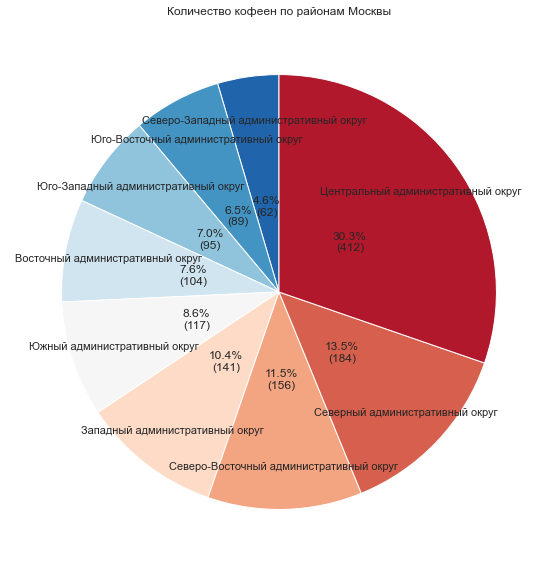

In [60]:
coffee_districts = coffee.groupby('district')['name'].count().sort_values()
sns.set(font_scale = 1.0)
plt.figure(figsize=(10, 10))
plt.title('Количество кофеен по районам Москвы')

def my_fmt(x):
    return '{:.1f}%\n({:.0f})'.format(x, len(coffee)*x/100)

patches, texts, autotexts = plt.pie(
    x=coffee_districts, 
    labels=coffee_districts.index, 
    autopct=my_fmt,
    colors=sns.color_palette('RdBu_r', n_colors=9),
    labeldistance=0.80,
    pctdistance=0.4,
    counterclock=True,
    startangle=90)
 
for text in texts:
    text.set_horizontalalignment('center')
 
for autotext in autotexts:
    autotext.set_horizontalalignment('center')
plt.savefig('moscafe_coffee_district.png', bbox_inches='tight', dpi = 300) 
plt.show()
None

Самое большое количество кофеен, как и ожидалось, в Центральном округе: 30% от всех кофеен, 402 заведения. От него сильно отстают Северный и Северо-Восточный округи с 13,5 и 11,5%. \
Меньше всего - в Северо-Западном, всего лишь 4,6% (62 кофейни).

In [61]:
m_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m_coffee)
coffee.apply(create_clusters, axis=1)
m_coffee

Если поизучать карту, то можно заметить, что кофейни часто располагаются либо на перекрестках, либо недалеко от них. Это удобно и логично: на перекрестках больше проходимость и недалеко расположены остановки общественного транспорта.

### <a id='toc1_6_3_'></a>[Круглосуточные кофейни](#toc0_)

Как иногда хочется выйти в два часа ночи на улицу, вдохнуть прохладный ночной воздух и выпить чашечку свежесваренного эспрессо... Проверим, существуют ли в Москве кофейни, открытые не только днем, но и ночью.

In [62]:
coffee['is_24/7'].value_counts()

False    1302
True       58
Name: is_24/7, dtype: int64

Целых 58 кофеен по всей Москве работают круглосуточно.

In [63]:
night_coffee = coffee[coffee['is_24/7'] == True]
m_night_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m_night_coffee)
night_coffee.apply(create_clusters, axis=1)
m_night_coffee

Ночных кофеен немного и они расположены преимущественно в центре, где ночная жизнь.

### <a id='toc1_6_4_'></a>[Какие рейтинги у кофеен?](#toc0_)

In [64]:
rating_coffee_chain = coffee.groupby('chain', as_index=False)['rating'].agg('mean')
rating_coffee_chain['rating'] = round(rating_coffee_chain['rating'], 2)
rating_coffee_chain

,chain,rating
0,False,4.35
1,True,4.21


Интересное наблюдение: несетевые кофейни оценивают выше, чем сетевые.

### <a id='toc1_6_5_'></a>[Распределение рейтингов по районам](#toc0_)

In [65]:
rating_coffee = coffee.groupby('district', as_index=False)['rating'].agg('mean')
rating_coffee['rating'] = round(rating_coffee['rating'], 2)
rating_coffee

,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.30
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.29
8,Южный административный округ,4.22


In [66]:
m_coffee_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdBu_r',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m_coffee_rating)
m_coffee_rating

Кофейни с самым высоким средним рейтингом расположены в Центральном и Северо-Западном округах Москвы. А с самым низким - в Западном. Впрочем, разница среднего рейтинга не такая уж большая: 4,34 в Центральном и 4,2 в Западном.

### <a id='toc1_6_6_'></a>[Стартовая стоимость чашки капучино](#toc0_)

In [67]:
coffee['middle_coffee_cup'].median() #берем медиану из-за пропусков

170.0

Для начала узнали медиану по всей Москве.

In [68]:
cappuccino = coffee.groupby('district')['middle_coffee_cup'].agg('median').sort_values(ascending=False) 
cappuccino

district
Юго-Западный административный округ        198.0
Центральный административный округ         190.0
Западный административный округ            187.0
Северо-Восточный административный округ    166.0
Северо-Западный административный округ     165.0
Северный административный округ            160.0
Юго-Восточный административный округ       147.5
Южный административный округ               144.0
Восточный административный округ           135.0
Name: middle_coffee_cup, dtype: float64

Самая дорогая чашка капучино - в Юго-Западном округе. Выше мы считали, что средний чек самый высокий в Центральном округе, но вот капучино там по стоимости на втором месте.

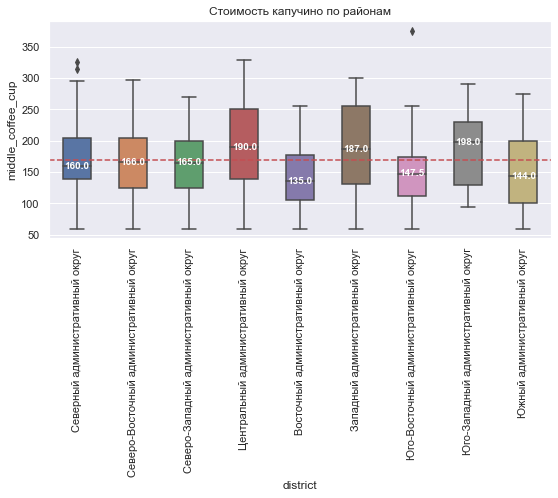

In [69]:
plt.title('Стоимость капучино по районам')
plt.xlabel('Район')
plt.ylabel('Стоимость, р.')
plt.xticks(rotation=90) 
box_plot = sns.boxplot(x='district', y='middle_coffee_cup', data=coffee, width=.5)

ax = box_plot.axes
lines = ax.get_lines()
categories = ax.get_xticks()

for cat in categories:
    # 4 отметка по у - медиана
    y = round(lines[4+cat*6].get_ydata()[0],1) 

    ax.text(
        cat, 
        y, 
        f'{y}', 
        ha='center', 
        va='center', 
        size=10,
        fontweight='bold',
        color='white')
    
plt.axhline(y = 170, color = 'r', linestyle = '--')
plt.savefig('moscafe_coffee_cappuccino_district.png', bbox_inches='tight', dpi = 300)
None    

Совмещаем ящики с усами со стоимостью по районам с указанной районной медианой и общемосковскую медиану. Во всех районах медианная стоимость входит в межквартильный размах.

Видим, что во всех районах есть вариант купить капучино за 170 рублей, просто где-то это будет ближе к "дорого", а где-то в самый раз и даже дешево.

### <a id='toc1_6_7_'></a>[Несетевые кофейни](#toc0_)

Вероятно, инвесторы собираются открыть несетевое заведение: об этом говорит постановка задачи и мотивация. Рассмотрим более внимательно несетевые кофейни.

In [70]:
top_non_chain = coffee[coffee['chain'] == False]
top_chain_coffee = coffee[coffee['chain'] == True]

In [71]:
m_top_non_chain = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(m_top_non_chain)
top_non_chain.apply(create_clusters, axis=1)
m_top_non_chain

Распределены по Москве они точно так же, как и сетевые.

In [72]:
print('Средний рейтинг несетевых кофеен Москвы:', round(top_non_chain['rating'].mean(), 2))
print('Средний рейтинг сетевых кофеен Москвы:', round(top_chain_coffee['rating'].mean(), 2))

Средний рейтинг несетевых кофеен Москвы: 4.35
Средний рейтинг сетевых кофеен Москвы: 4.21


In [73]:
print('Медианная стоимость чашки капучино в несетевых кофейнях Москвы:', round(top_non_chain['middle_coffee_cup'].median(), 2))
print('Медианная стоимость чашки капучино в сетевых кофейнях Москвы:', round(top_chain_coffee['middle_coffee_cup'].median(), 2))

Медианная стоимость чашки капучино в несетевых кофейнях Москвы: 170.0
Медианная стоимость чашки капучино в сетевых кофейнях Москвы: 152.0


Оценки мы видели и раньше, а вот то, что несетевые кофейни дороже сетевых мы узнали не только опытным, но теперь и аналитическим путем. \
В предоставленном датасете нет информации о количестве оценок: с ним мы могли бы найти лучшие заведения Москвы и рассмотреть их более внимательно, попытаться найти их секрет успеха.

### <a id='toc1_6_8_'></a>[Выводы](#toc0_)
Рассмотрели общественные заведения Москвы более внимательно с позиции изучения кофеен.
* Кофейни занимают третье место по количеству среди категорий заведений общественного питания Москвы и составляют 17% от всего или 1360.
* 30% кофеен расположены в Центральном округе.
* Количество сетевых и несетевых кофеен практически одинаково и отличается на 2 в сторону преобладания сетевых.
* 58 кофеен работают круглосуточно. Эти кофейни расположены преимущественно в Центральном округе.
* Самые высокие рейтинги кофеен в Центральном и Северо-Западном округах, но разброс рейтингов невелик: 4,34-4,2.
* Медианная стоимость чашки капучино по Москве составляет 170 рублей, и во всех районах это является актуальной и реалистичной стоимостью. Однако самый дорогой кофе на Юго-Западе, в центре и на Западе: около 190 рублей.
* Рейтинг несетевых кофеен выше рейтинга сетевых: 4,35 против 4,21.
* Медианная стоимость кофе в несетевых кофейнях совпадает с медианой по Москве.

### <a id='toc1_6_9_'></a>[Рекомендации](#toc0_)
Перспективной локацией для открытия кофейни можно назвать Юго-Западный и Западный округа Москвы: на данный момент там не так много кофеен, при этом высокая медианная стоимость кофе. Если инвесторы используют медианную стоимость по Москве или по несетевым кофейням в качестве стартовой стоимости чашки капучино (или даже немного прибавят), это может привлечь покупателей, так в тех районах привыкли к более дорогому кофе. \
Если у инвесторов есть конкретный проект реально уникального заведения, они могут открыться и в Центральном районе и привлекать клиентов за счет своей идеи и, опять же, демпинга, если взять за стартовую цену медиану. 